In [30]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [31]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader

from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from MAE.component_model import ComponentMAE
from DCGAN.unet          import UNet

from CityScapes.datasets import CityscapesDataset
from DCGAN.loss_functions import (
    EntropyLoss,
    TotalVariationLoss,
    WeightedMSELoss,
    SoftRoutingLoss,
    DilatedReconstructionLoss,
)

device             = "cuda" if torch.cuda.is_available() else "cpu"
scale_for_display  = lambda x: x.mul(0.5).add(0.5).clamp(0, 1)
print(f"Device: {device}")

Device: cuda


In [32]:
# ── Data ──────────────────────────────────────────────────────────────────────
IMG_SIZE   = 256   # must be divisible by PATCH_SIZE — adjust to your preprocessing
BATCH_SIZE = 8

# ── ComponentMAE (reconstruction model) ──────────────────────────────────────
PATCH_SIZE         = 16
IN_CHANNELS        = 3
MASK_RATIO         = 0.25
N_COMPONENTS       = 7

ENCODER_EMBED_DIM  = 768
ENCODER_DEPTH      = 12
ENCODER_NUM_HEADS  = 12

DECODER_EMBED_DIM  = 512    # shallow decoder
DECODER_DEPTH      = 4
DECODER_NUM_HEADS  = 16
MLP_RATIO          = 4.0
DROPOUT            = 0.0

# ── Segmentation UNet ─────────────────────────────────────────────────────────
SEG_CHANNELS           = [256, 128, 64, 32, 32, 32,16]
SEG_CUT_CONNECTIONS    = 4

# ── Optimisers ────────────────────────────────────────────────────────────────
REC_MODEL_LR  = 1.0e-4
SEG_MODEL_LR  = 1.0e-5

# ── Loss weights ──────────────────────────────────────────────────────────────
RECON_WEIGHT              = 10.0
ENTROPY_WEIGHT            = 0.01
TV_WEIGHT                 = 0.01
ROUTING_WEIGHT            = 1.0
DILATED_RECON_WEIGHT      = 10.0
LABEL_SMOOTHING           = 0.2

In [33]:
msg_dataset  = CityscapesDataset()
train_loader = DataLoader(msg_dataset, batch_size=BATCH_SIZE, shuffle=True)
print(f"Dataset: {len(msg_dataset)} samples  |  {len(train_loader)} batches/epoch")

Dataset: 19998 samples  |  2500 batches/epoch


In [34]:
# ── Reconstruction model ─────────────────────────────────────────────────────
# One shared ViT encoder  +  N_COMPONENTS independent shallow decoders.
# Each decoder's mask_token parameter is the per-component prior
# (replaces the SpatialVectorizer tile codebook).
rec_model = ComponentMAE(
    img_size             = IMG_SIZE,
    patch_size           = PATCH_SIZE,
    in_channels          = IN_CHANNELS,
    encoder_embed_dim    = ENCODER_EMBED_DIM,
    encoder_depth        = ENCODER_DEPTH,
    encoder_num_heads    = ENCODER_NUM_HEADS,
    decoder_embed_dim    = DECODER_EMBED_DIM,
    decoder_depth        = DECODER_DEPTH,
    decoder_num_heads    = DECODER_NUM_HEADS,
    mlp_ratio            = MLP_RATIO,
    mask_ratio           = MASK_RATIO,
    dropout              = DROPOUT,
    number_of_components = N_COMPONENTS,
).to(device)

rec_model_optimizer = optim.Adam(rec_model.parameters(), lr=REC_MODEL_LR)
print(f"ComponentMAE parameters: {rec_model.num_parameters:,}")

ComponentMAE parameters: 179,438,848


In [35]:
# ── Segmentation model (unchanged from original VectorizedUNet setup) ────────
seg_model = UNet(
    channels        = SEG_CHANNELS,
    out_channels    = N_COMPONENTS,
    cut_connections = SEG_CUT_CONNECTIONS,
).to(device)

seg_model_optimizer = optim.Adam(seg_model.parameters(), lr=SEG_MODEL_LR)
print(f"UNet parameters: {sum(p.numel() for p in seg_model.parameters() if p.requires_grad):,}")

UNet parameters: 4,241,991


/tmp/ipykernel_869052/3003486520.py:25: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


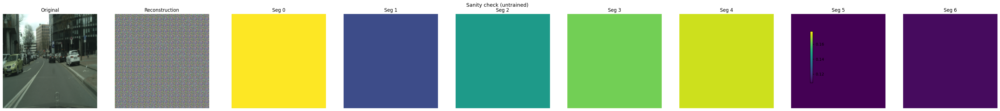

Input mean: -0.3570  |  Rec mean: 0.0023


In [36]:
data, _ = next(iter(train_loader))

with torch.no_grad():
    x          = data.to(device)
    seg_logits = seg_model(x)
    seg_probs  = torch.softmax(seg_logits, dim=1)

    reconstructions, mask = rec_model(x, seg_probs)

fig, ax = plt.subplots(1, 2 + N_COMPONENTS, figsize=(4 * (2 + N_COMPONENTS), 4))

ax[0].imshow(scale_for_display(x)[0].cpu().permute(1, 2, 0).numpy())
ax[0].set_title("Original");  ax[0].axis("off")

ax[1].imshow(scale_for_display(reconstructions)[0].cpu().permute(1, 2, 0).numpy())
ax[1].set_title("Reconstruction");  ax[1].axis("off")

vmin, vmax = seg_probs[0].min().item(), seg_probs[0].max().item()
for i in range(N_COMPONENTS):
    im = ax[2 + i].imshow(seg_probs[0, i].cpu().numpy(), vmin=vmin, vmax=vmax, cmap="viridis")
    ax[2 + i].set_title(f"Seg {i}");  ax[2 + i].axis("off")

fig.colorbar(im, ax=ax[2:].tolist(), shrink=0.6)
plt.suptitle("Sanity check (untrained)", fontsize=13)
plt.tight_layout()
plt.show()
print(f"Input mean: {x.mean():.4f}  |  Rec mean: {reconstructions.mean():.4f}")

In [37]:
reconstruction_loss_fn        = WeightedMSELoss(weight=RECON_WEIGHT)
entropy_loss_fn               = EntropyLoss(weight=ENTROPY_WEIGHT)
tv_loss_fn                    = TotalVariationLoss(weight=TV_WEIGHT)
routing_loss_fn               = SoftRoutingLoss(weight=ROUTING_WEIGHT)
dilated_reconstruction_loss_fn= DilatedReconstructionLoss(
                                    dilation_kernel_size=3,
                                    weight=DILATED_RECON_WEIGHT,
                                )

In [44]:
epochs = 100


entorpy_temp = 0.01

for epoch in range(epochs):
    loop = tqdm(train_loader, desc=f"Epoch {epoch}/{epochs - 1}")
    # entorpy_temp +=0.01
    for data, _ in loop:

        full_img = data.to(device)

        # ── Forward: segmentation ──────────────────────────────────────────
        seg_logits = seg_model(full_img)
        seg_probs  = F.softmax(seg_logits, dim=1)

        # Label smoothing (same as original)
        if LABEL_SMOOTHING > 0:
            seg_probs = (seg_probs * (1.0 - LABEL_SMOOTHING)) + (LABEL_SMOOTHING / N_COMPONENTS)

        # ── Forward: blended reconstruction ───────────────────────────────
        # mask is returned for potential MAE-style patch loss
        reconstructions, mask = rec_model(full_img, seg_probs)

        # ── Forward: independent reconstructions for routing / dilated loss ─
        # Second call with seg_probs=None → (B, N, C, H, W) per-component images
        # independent_reconstructions, _ = rec_model(full_img, seg_probs=None)

        # ── Losses ────────────────────────────────────────────────────────
        # Reconstruction: MSE on the composed (blended) image
        recon_loss = reconstruction_loss_fn(reconstructions, full_img)

        # # Routing: pushes seg_probs toward whichever component reconstructs best
        # routing_loss = routing_loss_fn(
        #     independent_reconstructions, full_img, seg_logits
        # )

        # # Dilated reconstruction: per-component MSE in dilated mask regions
        # dilated_reconstruction_loss = dilated_reconstruction_loss_fn(
        #     independent_reconstructions, full_img, seg_probs
        # )

        # # Entropy: encourages confident (near-binary) segmentation masks
        entropy_loss =entorpy_temp* entropy_loss_fn(seg_logits)

        # # Total Variation: encourages spatially smooth segmentation masks
        tv_loss = entorpy_temp *tv_loss_fn(seg_probs)

        loss = (
            recon_loss               +
            # routing_loss             +
            # dilated_reconstruction_loss +
            entropy_loss             +
            tv_loss
        )

        # ── Backward ──────────────────────────────────────────────────────
        seg_model_optimizer.zero_grad()
        rec_model_optimizer.zero_grad()

        loss.backward()

        seg_model_optimizer.step()
        rec_model_optimizer.step()


        loop.set_postfix(
            loss                     = loss.item(),
            recon_loss               = recon_loss.item(),
            # routing_loss             = routing_loss.item(),
            # dilated_recon            = dilated_reconstruction_loss.item(),
            entropy_loss             = entropy_loss.item(),
            tv_loss                  = tv_loss.item(),
        )

    torch.save(seg_model.state_dict(), "seg_model.pt")
    torch.save(rec_model.state_dict(), "rec_model.pt")

Epoch 1/99:  72%|███████▏  | 1791/2500 [07:17<02:53,  4.09it/s, entropy_loss=0.000175, loss=0.0674, recon_loss=0.0673, tv_loss=3.86e-7]


KeyboardInterrupt: 

(np.float64(-0.5), np.float64(255.5), np.float64(255.5), np.float64(-0.5))

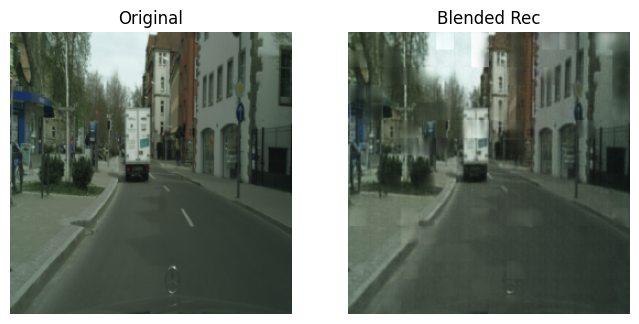

In [46]:
# ── Visualisation 1: original | blended reconstruction | seg maps ─────────────
data, _ = next(iter(train_loader))

with torch.no_grad():
    x          = data.to(device)
    seg_logits = seg_model(x)
    seg_probs  = torch.softmax(seg_logits, dim=1)
    reconstructions, mask = rec_model(x, seg_probs)

fig, ax = plt.subplots(1, 2, figsize=(4 * (2), 4))


ax[0].imshow(scale_for_display(x)[0].cpu().permute(1, 2, 0).numpy())
ax[0].set_title("Original");  ax[0].axis("off")

ax[1].imshow(scale_for_display(reconstructions)[0].cpu().permute(1, 2, 0).numpy())
ax[1].set_title("Blended Rec");  ax[1].axis("off")


Component 0 mean seg prob: 0.1445
Component 1 mean seg prob: 0.1621
Component 2 mean seg prob: 0.2251
Component 3 mean seg prob: 0.1531
Component 4 mean seg prob: 0.1418
Component 5 mean seg prob: 0.0826
Component 6 mean seg prob: 0.0909


/tmp/ipykernel_869052/955742777.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


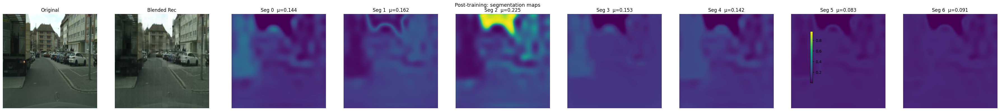

In [47]:
# ── Visualisation 1: original | blended reconstruction | seg maps ─────────────
data, _ = next(iter(train_loader))

with torch.no_grad():
    x          = data.to(device)
    seg_logits = seg_model(x)
    seg_probs  = torch.softmax(seg_logits, dim=1)
    reconstructions, mask = rec_model(x, seg_probs)

fig, ax = plt.subplots(1, 2 + N_COMPONENTS, figsize=(4 * (2 + N_COMPONENTS), 4))

ax[0].imshow(scale_for_display(x)[0].cpu().permute(1, 2, 0).numpy())
ax[0].set_title("Original");  ax[0].axis("off")

ax[1].imshow(scale_for_display(reconstructions)[0].cpu().permute(1, 2, 0).numpy())
ax[1].set_title("Blended Rec");  ax[1].axis("off")

vmin, vmax = seg_probs[0].min().item(), seg_probs[0].max().item()
for i in range(N_COMPONENTS):
    im = ax[2 + i].imshow(seg_probs[0, i].cpu().numpy(), vmin=vmin, vmax=vmax, cmap="viridis")
    mean_val = seg_probs[0, i].mean().item()
    ax[2 + i].set_title(f"Seg {i}  μ={mean_val:.3f}");  ax[2 + i].axis("off")
    print(f"Component {i} mean seg prob: {mean_val:.4f}")

fig.colorbar(im, ax=ax[2:].tolist(), shrink=0.6)
plt.suptitle("Post-training: segmentation maps", fontsize=13)
plt.tight_layout()
plt.show()

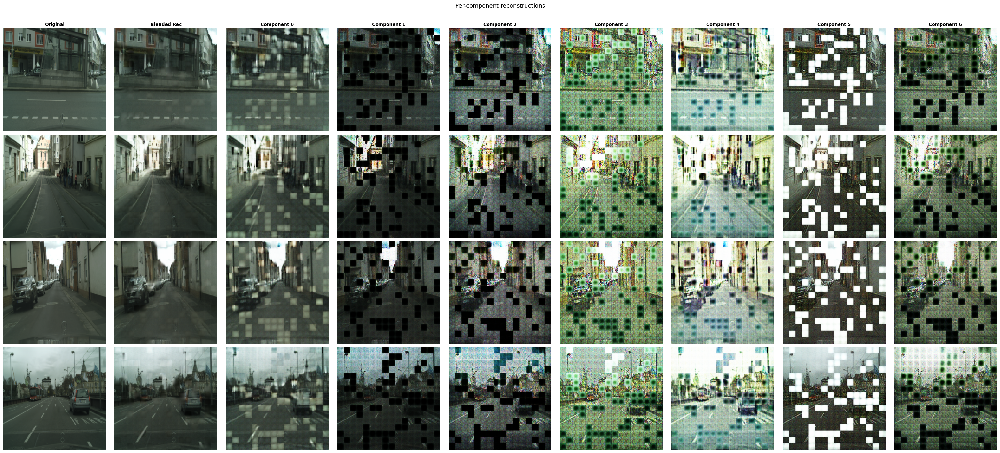

In [ ]:
# ── Visualisation 2: per-component reconstructions ────────────────────────────
# Each row = one sample from the batch
# Columns: Original | Blended Rec | Comp-0 | Comp-1 | ... | Comp-(N-1)
N_SHOW = min(4, BATCH_SIZE)

with torch.no_grad():
    indep_recs, _ = rec_model(x, seg_probs=None)
    # indep_recs: (B, N, C, H, W)

n_cols = 2 + N_COMPONENTS
fig, axes = plt.subplots(N_SHOW, n_cols, figsize=(3.5 * n_cols, 3.5 * N_SHOW),
                          squeeze=False)

col_titles = (["Original", "Blended Rec"] +
              [f"Component {i}" for i in range(N_COMPONENTS)])
for col, title in enumerate(col_titles):
    axes[0][col].set_title(title, fontsize=10, fontweight="bold")

for row in range(N_SHOW):
    axes[row][0].imshow(scale_for_display(x)[row].cpu().permute(1, 2, 0).numpy())
    axes[row][1].imshow(scale_for_display(reconstructions)[row].cpu().permute(1, 2, 0).numpy())
    for i in range(N_COMPONENTS):
        axes[row][2 + i].imshow(
            scale_for_display(indep_recs[row, i]).cpu().permute(1, 2, 0).numpy()
        )
    for col in range(n_cols):
        axes[row][col].axis("off")

plt.suptitle("Per-component reconstructions", fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

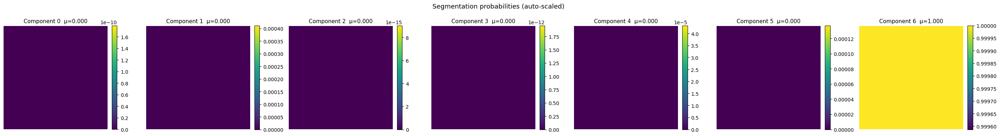

In [ ]:
# ── Visualisation 3: segmentation maps only (auto-scaled per map) ─────────────
fig, axes = plt.subplots(1, N_COMPONENTS, figsize=(4 * N_COMPONENTS, 4), squeeze=False)

for i in range(N_COMPONENTS):
    seg_map = seg_probs[0, i].cpu().numpy()
    im = axes[0][i].imshow(seg_map, cmap="viridis")
    axes[0][i].set_title(f"Component {i}  μ={seg_map.mean():.3f}", fontsize=11)
    axes[0][i].axis("off")
    fig.colorbar(im, ax=axes[0][i], fraction=0.046, pad=0.04)

plt.suptitle("Segmentation probabilities (auto-scaled)", fontsize=13)
plt.tight_layout()
plt.show()